In [1]:
import numpy as np
import pandas as pd
import os
import warnings
transfer_learning = True
warnings.filterwarnings('ignore')

In [2]:
ip_path=[]
label=[]

for class_name in os.listdir("PetImages"):
    if not os.path.isdir("PetImages/"+class_name):
        continue
    for path in os.listdir("PetImages/"+class_name):
        if class_name=='Cat':
            label.append(0)
        else:
            label.append(1)
        ip_path.append(os.path.join("PetImages",class_name,path))
print(ip_path[0],label[0])

PetImages\Cat\0.jpg 0


In [3]:
df=pd.DataFrame()
df['images']=ip_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages\Dog\10835.jpg,1
1,PetImages\Cat\1955.jpg,0
2,PetImages\Cat\10908.jpg,0
3,PetImages\Cat\10695.jpg,0
4,PetImages\Dog\5208.jpg,1


In [4]:
from PIL import Image
from tqdm import tqdm

drop_idx=[]
for i in tqdm(range(len(df['images']))):
    img_path=df.iloc[i,0]
    try:
        img=Image.open(img_path)
    except:
        drop_idx.append(i)

print(drop_idx)

100%|████████████████████████████████████████████████████████████████████████████| 24961/24961 [05:52<00:00, 70.79it/s]

[6490, 17905]


In [5]:
df.drop(drop_idx,inplace=True)

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.


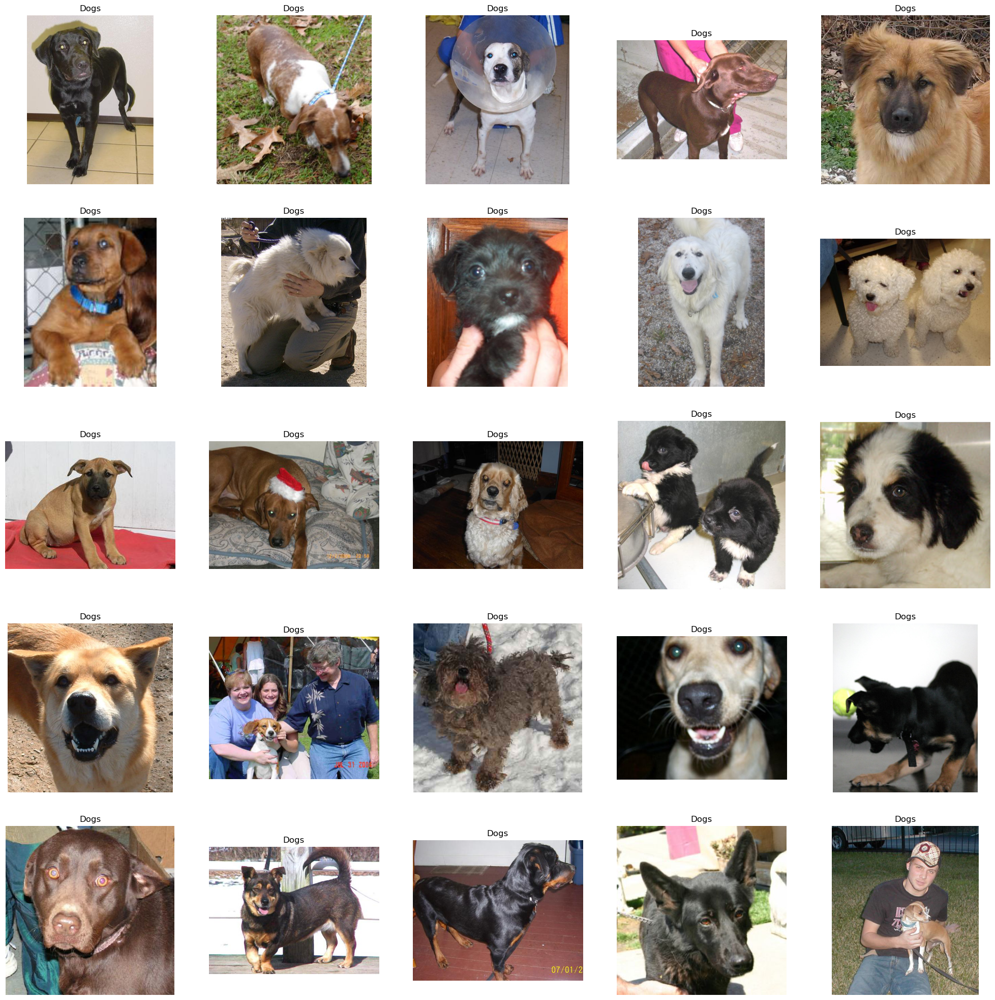

In [6]:
# to display grid of images
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img
import random

plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

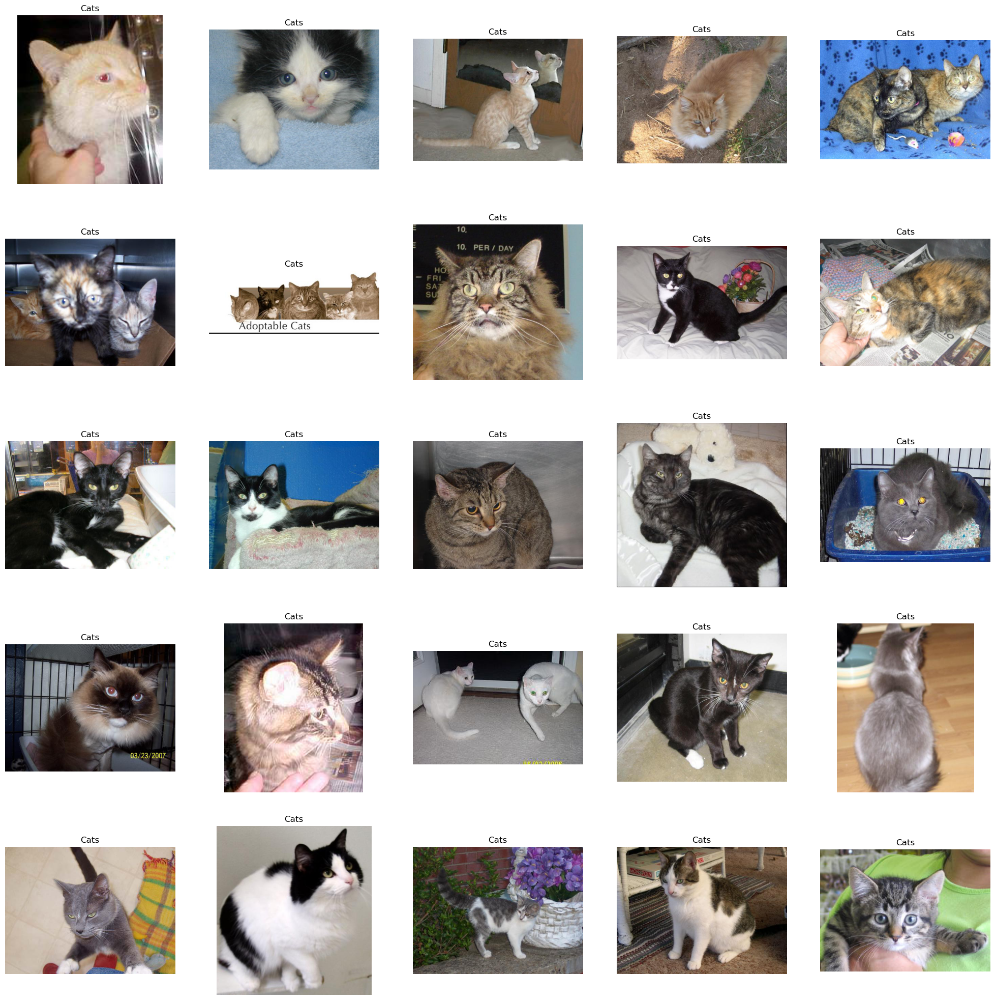

In [7]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<BarContainer object of 2 artists>

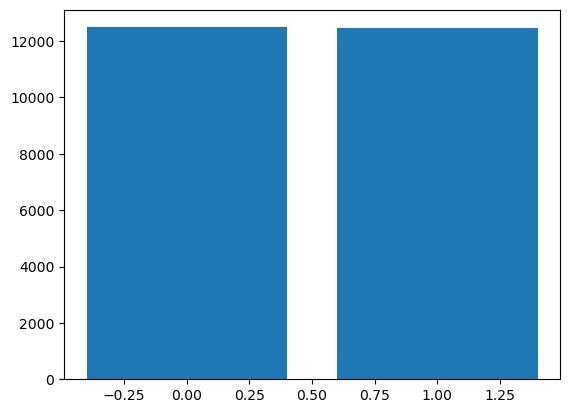

In [8]:
import matplotlib.pyplot as plt
plt.bar(df['label'].value_counts().index, df['label'].value_counts().values)

In [9]:
df['label'] = df['label'].astype('str')

In [10]:
df['label'].value_counts()

0    12490
1    12469
Name: label, dtype: int64

In [11]:
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2,random_state=42)

In [12]:
from keras_preprocessing.image import ImageDataGenerator
train_generator=ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

val_generator=ImageDataGenerator(rescale=1./255)

In [13]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model=Sequential()
model.add(Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)))
model.add(MaxPool2D((2,2)))
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(MaxPool2D((2,2)))
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPool2D((2,2)))
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

In [14]:
#transfer learning resnet50
from keras.applications.resnet50 import ResNet50
from keras.layers import Input, GlobalAveragePooling2D, Dropout, Dense

input = Input(shape=(128,128,3))
base_resnet50 = ResNet50(include_top=False, input_shape=(128,128,3), input_tensor=input, weights='imagenet')
for layer in base_resnet50.layers[:]:
        layer.trainable = False # Freeze the layers

custom_model = Sequential()
custom_model.add(base_resnet50)
custom_model.add(GlobalAveragePooling2D())
custom_model.add(Dense(64, activation='relu'))
custom_model.add(Dropout(0.5))
custom_model.add(Dense(1, activation='sigmoid'))
custom_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 64)                131136    
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 23718913 (90.48 MB)
Trainable params: 131201 (512.50 KB)
Non-trainable params: 23587712 (89.98 MB)
_______

In [15]:
if transfer_learning:
    model=custom_model

In [16]:
model.compile(optimizer="adam",loss="binary_crossentropy",metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 64)                131136    
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 23718913 (90.48 MB)
Trainable params: 131201 (512.50 KB)
Non-trainable params: 23587712 (89.98 MB)
_______

In [17]:
train_iterator=train_generator.flow_from_dataframe(
    train,x_col='images',y_col='label',
    target_size=(128,128),batch_size=512,class_mode='binary')

val_iterator=val_generator.flow_from_dataframe(
    test,x_col='images',y_col='label',
    target_size=(128,128),batch_size=512,class_mode='binary')

history=model.fit(train_iterator,epochs=5,validation_data=val_iterator)

Found 19967 validated image filenames belonging to 2 classes.
Found 4992 validated image filenames belonging to 2 classes.
Epoch 1/5
39/39 [==============================] - 1381s 35s/step - loss: 0.7094 - accuracy: 0.5131 - val_loss: 0.6833 - val_accuracy: 0.5946
Epoch 2/5
39/39 [==============================] - 4973s 130s/step - loss: 0.6856 - accuracy: 0.5545 - val_loss: 0.6765 - val_accuracy: 0.5980
Epoch 3/5
39/39 [==============================] - 1251s 32s/step - loss: 0.6814 - accuracy: 0.5698 - val_loss: 0.6732 - val_accuracy: 0.5807
Epoch 4/5
39/39 [==============================] - 1171s 30s/step - loss: 0.6781 - accuracy: 0.5732 - val_loss: 0.6648 - val_accuracy: 0.6230
Epoch 5/5
39/39 [==============================] - 1310s 34s/step - loss: 0.6721 - accuracy: 0.5944 - val_loss: 0.6585 - val_accuracy: 0.6316


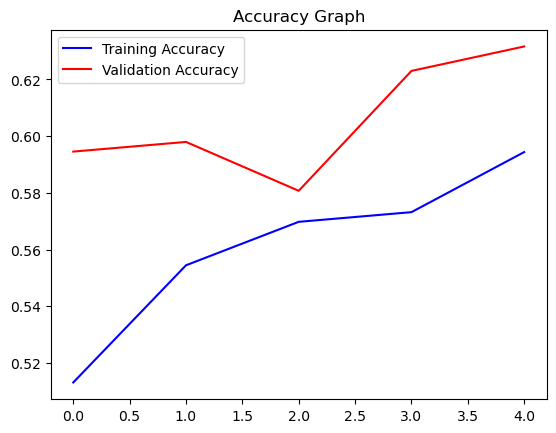

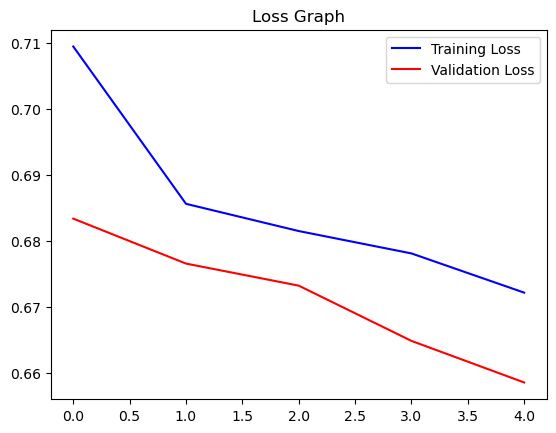

In [18]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [23]:
import tensorflow as tf

img = tf.keras.utils.load_img(test.iloc[13,0], target_size=(128,128))
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

y_pred = model.predict(img_array)
y_pred=np.where(y_pred > 0.5, 1,0)
final_op="Dog" if y_pred==1 else "Cat"

1/1 [==============================] - 1s 1s/step


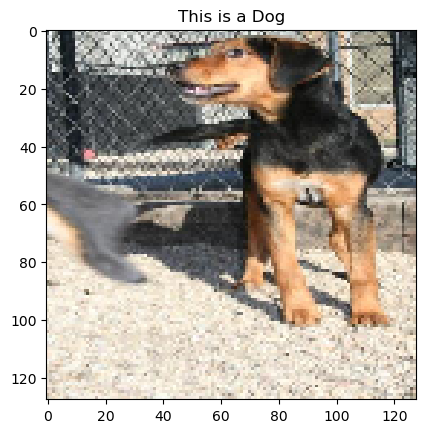

In [24]:
plt.imshow(img, cmap="gray", interpolation='none')
plt.title("This is a {}".format(final_op))
plt.show()